In [ ]:
# Modify this to locate the directory of source folder
%cd /drive/sourcefolder

# Import libraries

In [3]:
import pandas as pd
pd.set_option('max_colwidth', None)
import numpy as np
import datetime
import nltk
import math
# from tqdm import tqdm
from tqdm.auto import tqdm

# For Sentiment Analysis
nltk.downloader.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

# For Visualisation
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
!pip install pyLDAvis
import pyLDAvis
from wordcloud import WordCloud
# For word cloud masking
import PIL
from PIL import Image

# For Topic Modelling
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
!pip install --pre --upgrade gensim
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim import corpora, models
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS
from gensim.models import CoherenceModel
from gensim.test.utils import datapath
import spacy

# For gensim logging
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

CUSTOM_STOPWORDS = STOPWORDS.union(set(['can', 'say']))

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


/usr/local/lib/python3.7/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working

/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:4: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_lda.py:29: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



Requirement already up-to-date: gensim in /usr/local/lib/python3.7/dist-packages (4.0.1)


/usr/local/lib/python3.7/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning:

`scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.

/usr/local/lib/python3.7/dist-packages/gensim/similarities/__init__.py:15: UserWarning:

The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.



In [6]:
# Word cloud mask
mask_upvote = np.array(Image.open('masks/mask_upvote.png'))
mask_downvote = np.array(Image.open('masks/mask_downvote.png'))
mask_covid = np.array(Image.open('masks/mask_covid.png'))

def plot_cloud(wordcloud):
    plt.figure(figsize=(20, 20))
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off")

# Preprocess comment dataset
* lemmatization
* tokenization
* remove stop words and tokens with less than 3 characters

In [ ]:
df = pd.read_pickle('pickle/comments_processed_preSA.pkl')

In [ ]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatization(text, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV', 'PROPN']):
    output = []
    doc = nlp(text)
    for token in doc:
        if token.pos_ in allowed_postags:
            output.append(token.lemma_)
    return(output)

def preprocess(text):
    processed_text = gensim.utils.simple_preprocess(text)
    for token in processed_text:
        if token in STOPWORDS or len(token) < 3:
            processed_text.remove(token)
    string = ' '.join([word for word in processed_text])
    return(lemmatization(string))

In [ ]:
df['body'] = df['body'].map(preprocess)

ipykernel_launcher:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
df.to_pickle('pickle/comments_tokenized.pkl')

# Sentiment Analysis with VADER
-----------

In [ ]:
df = pd.read_pickle('pickle/comments_processed.pkl')

In [ ]:
df['compound_score'] = df['body'].apply(lambda text: sid.polarity_scores(text)['compound'])
df['sentiment'] = df['compound_score'].apply(lambda score: 'positive' if score>=0.05 else ('negative' if score<=-0.05 else 'neutral'))

Save dataframe
```
df.to_pickle('pickle/comments_sentiment.pkl')
```

In [9]:
# Load dataframe with VADER already performed
df = pd.read_pickle('pickle/comments_sentiment.pkl')

In [10]:
print(df.shape)
print(df.columns)

(8499244, 12)
Index(['id', 'author', 'body', 'score', 'total_awards_received', 'created_utc',
       'label', 'month', 'week', 'compound_score', 'sentiment',
       'subreddit_sentiment'],
      dtype='object')


In [11]:
# Observe count for each sentiment
df['sentiment'].value_counts().reset_index(name = 'count')

,index,count
0,positive,3288082
1,negative,3213921
2,neutral,1997241


In [12]:
# Observe count for each sentiment by month
df2 = df.groupby(['month', 'sentiment']).size().reset_index(name = 'count')

In [13]:
df2.head()

,month,sentiment,count
0,2020-01,negative,18062
1,2020-01,neutral,12103
2,2020-01,positive,17047
3,2020-02,negative,162105
4,2020-02,neutral,112085


## Observe trend of comments' sentiments
-----

In [ ]:
'''
Line chart (not used)
'''
# months = df2['month'].unique()

# fig = go.Figure()

# fig.add_trace(go.Scatter(x=months, y=df2[df2['sentiment']=='positive']['count'], mode='lines', marker_color='lightcoral', name='positive'))
# fig.add_trace(go.Scatter(x=months, y=df2[df2['sentiment']=='neutral']['count'], mode='lines', marker_color='darkseagreen', name='neutral'))
# fig.add_trace(go.Scatter(x=months, y=df2[df2['sentiment']=='negative']['count'], mode='lines', marker_color='cornflowerblue', name='negative'))

# fig.show()

In [16]:
months = df2['month'].unique()

fig = go.Figure(data=[
    go.Bar(name='positive', x=months, y=df2[df2['sentiment']=='positive']['count'], marker_color='lightcoral'),
    go.Bar(name='neutral', x=months, y=df2[df2['sentiment']=='neutral']['count'], marker_color='lightgreen'),
    go.Bar(name='negative', x=months, y=df2[df2['sentiment']=='negative']['count'], marker_color='cornflowerblue')
    ])
# Change the bar mode
fig.update_layout(barmode='group', 
xaxis = dict(
    title = 'Month',
    tickmode = 'array',
    tickvals = months,
    tickformat = '%b-%Y'
    ),
yaxis = dict(
    title = 'Number of comments'
    )
)
fig.show()

### Score-weighted sentiment of comments (not used)
----

In [ ]:
# df['score'].describe()

count    8.499244e+06
mean     2.752250e+00
std      2.960760e+01
min     -6.420000e+02
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      1.124700e+04
Name: score, dtype: float64

In [ ]:
# def compute_subredditsentiment(row):
#     # return if comment is neutral
#     if row['sentiment'] == 'neutral':
#         return row['compound_score']
    
#     votes = row['score']
#     if votes == 1:
#         # no upvotes/downvotes
#         return row['compound_score']
#     elif votes > 1:
#         # upvoted
#         return np.log10(row['score']) * row['compound_score']
#     else:
#         # votes <= 0
#         return np.log10(abs(row['score']) + 1) * row['compound_score'] * -1

In [ ]:
# tqdm.pandas()
# df['subreddit_sentiment'] = df.progress_apply(compute_subredditsentiment, axis=1)

In [ ]:
# df['subreddit_sentiment'] = df['subreddit_sentiment'].round(3)

In [ ]:
# df['subreddit_sentiment'].describe()

count    8.499244e+06
mean    -1.438817e-03
std      4.498725e-01
min     -3.744000e+00
25%     -2.760000e-01
50%      0.000000e+00
75%      2.960000e-01
max      3.689000e+00
Name: subreddit_sentiment, dtype: float64

#### Generate scatter plot to observe positive and negative comments
-----

In [ ]:
# df_posneg = df[df['sentiment'] != 'neutral']

In [ ]:
# # Take a sample because plotly cannot plot all 9 million rows of data
# df_sample = df_posneg.sample(frac=0.1)

In [ ]:
# fig = go.Figure(data=go.Scattergl(
#     x = df_sample['month'],
#     y = df_sample['subreddit_sentiment'],
#     # text=df_sample['body'],
#     # hoverinfo='text',
#     mode='markers',
#     labels=''
#     marker=dict(
#         color= df_sample['subreddit_sentiment'],
#         colorscale='Rdbu_r',
#         showscale=True,
#         line_width=1
#     )
# ))

# fig.update_layout(
#     title="Comments",
#     xaxis_title="Months",
#     yaxis_title="Score-weighted Sentiment",
#     legend_title="Score-weighted Sentiment"
# )
# fig.show()

## Generate word clouds for negative and positive comments
-----

In [ ]:
df_sentiment = pd.read_pickle('pickle/comments_sentiment.pkl')
df_tokens = pd.read_pickle('pickle/comments_tokenized.pkl')

In [ ]:
index_positivesent = df_sentiment[df_sentiment['sentiment']=='positive'].index
index_negativesent = df_sentiment[df_sentiment['sentiment']=='negative'].index

In [ ]:
print(index_positivesent)
print(index_negativesent)

In [ ]:
# Retrieving positive and negative comments in their tokenized form
df_positivesent_tokens = df_tokens.loc[index_positivesent]
df_negativesent_tokens = df_tokens.loc[index_negativesent]
print(df_positivesent_tokens.shape)
print(df_negativesent_tokens.shape)

(3288082, 2)
(3213921, 2)


### Converting positive-sentiment and negative-sentiment comments to separate corpus

In [ ]:
'''
docs_with_bigrams: nested lists of strings
docs_with_bigrams_merged: list of strings
'''

In [ ]:
positivesent_doc = df_positivesent_tokens['body'].to_list()
negativesent_doc = df_negativesent_tokens['body'].to_list()

In [ ]:
# Extract bigrams from positive-sentiment comments
bigram = Phrases(positivesent_doc, min_count=20, threshold=100, connector_words=ENGLISH_CONNECTOR_WORDS)
bigram_phraser = gensim.models.phrases.Phraser(bigram)
docs_with_bigrams = [bigram_phraser[doc] for doc in positivesent_doc]

In [ ]:
# Flatten the list
import itertools
docs_with_bigrams_merged = list(itertools.chain.from_iterable(docs_with_bigrams))

In [ ]:
# corpus is a list with one string
corpus = [' '.join(docs_with_bigrams_merged)]

In [ ]:
# Extract bigrams from negative-sentiment comments
bigram = Phrases(negativesent_doc, min_count=20, threshold=100, connector_words=ENGLISH_CONNECTOR_WORDS)
bigram_phraser = gensim.models.phrases.Phraser(bigram)
docs_with_bigrams = [bigram_phraser[doc] for doc in negativesent_doc]
# Flatten list
docs_with_bigrams_merged = list(itertools.chain.from_iterable(docs_with_bigrams))

In [ ]:
# list with one string
negativesent_corpus = [' '.join(docs_with_bigrams_merged)]

In [ ]:
# append string in negativesent_corpus to corpus
# corpus now has two strings, one for positive comments and another for negative comments
corpus.append(negativesent_corpus[0])

In [ ]:
c_vectorizer = CountVectorizer(max_df=1, max_features=100000)
X = c_vectorizer.fit_transform(corpus)

In [ ]:
X = X.toarray()

In [ ]:
bow = pd.DataFrame(X, columns = c_vectorizer.get_feature_names())
bow.index = ['positive','negative']

### Compute Log Odds Ratio
-----

In [ ]:
t_bow_df = pd.DataFrame()

# By candidate, divide the number of times a word is said, 
# by the total number of times they've said all the words that they have said (frequency)
bow_transformed = bow.apply(lambda x: (x+1)/(bow.loc[x.name].sum()+1), axis=1)

2021-03-19 12:22:15,697 : INFO : NumExpr defaulting to 4 threads.


In [ ]:
sentiment_types = df_posneg.sentiment.unique()

In [ ]:
for sentiment in tqdm(sentiment_types):
    feat_s = bow[bow.index != sentiment].sum() + 1
    feat_s_all = np.sum(bow[bow.index != sentiment].sum())
    tot = feat_s / feat_s_all
    row = bow_transformed.loc[sentiment] / tot
    row = pd.DataFrame(row).T
    results = row.apply(lambda x: math.log(x,2))

    t_bow_df = pd.concat([t_bow_df, pd.DataFrame([results], index=[sentiment])])

100%|██████████| 2/2 [00:10<00:00,  5.10s/it]


In [ ]:
t_bow_df

In [ ]:
text_positive = t_bow_df.loc['positive'].sort_values(ascending=False).to_dict()
text_negative = t_bow_df.loc['negative'].sort_values(ascending=False).to_dict()

In [ ]:
# # Save dataframe
# t_bow_df.to_pickle('pickle/comments_sentiment_logodds.pkl')

In [ ]:
# # Remove redundant/uninsightful terms
# text_positive.pop('human_being')

10.83363202181244

In [ ]:
print(list(text_positive)[:15])
print(list(text_negative)[:15])

['icu_bed', 'spring_break', 'spanish_flu', 'cough_sneeze', 'mouth_nose', 'nose_mouth', 'swine_flu', 'wall_street', 'anecdotal_evidence', 'heart_attack', 'underlie_condition', 'first_responder', 'ten_million', 'pre_symptomatic', 'memory_cell']
['wash_hand', 'pre_exist', 'dry_cough', 'wild_animal', 'natural_disaster', 'washing_hand', 'free_speech', 'weaken_immune', 'democratic_hoax', 'air_pollution', 'liquor_store', 'burden_proof', 'rocket_science', 'plain_simple', 'apartment_building']


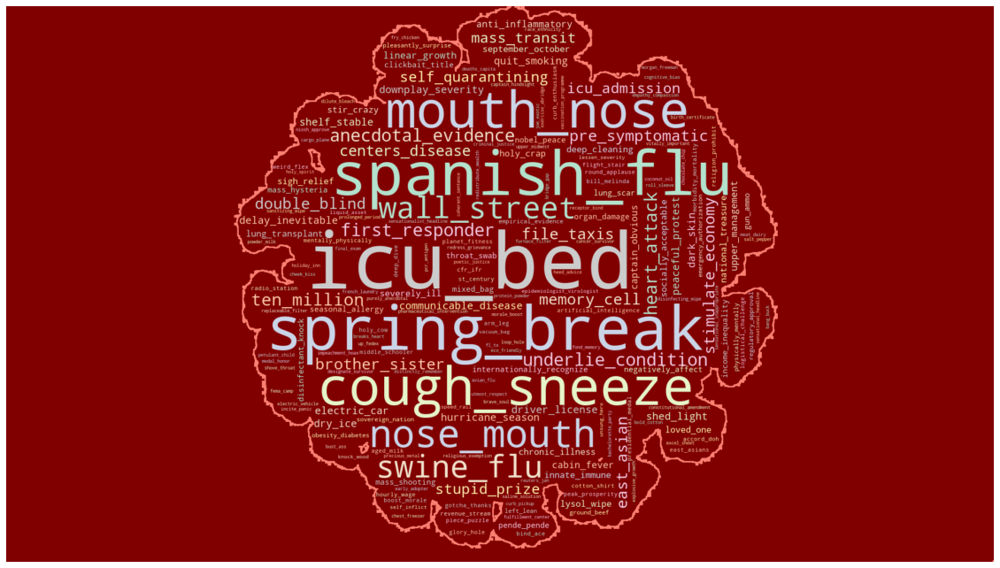

In [ ]:
wordcloud = WordCloud(width = 3000, height = 2000, min_word_length=3, background_color='maroon', contour_color='salmon', contour_width=4, mask=mask_covid, colormap='Pastel2')
wordcloud.generate_from_frequencies(text_positive)
plot_cloud(wordcloud)

In [ ]:
# df_sentiment[(df_sentiment['sentiment']=='negative') & (df_sentiment['body'].str.contains('dry cough'))].sample(15).sort_values(by='compound_score')

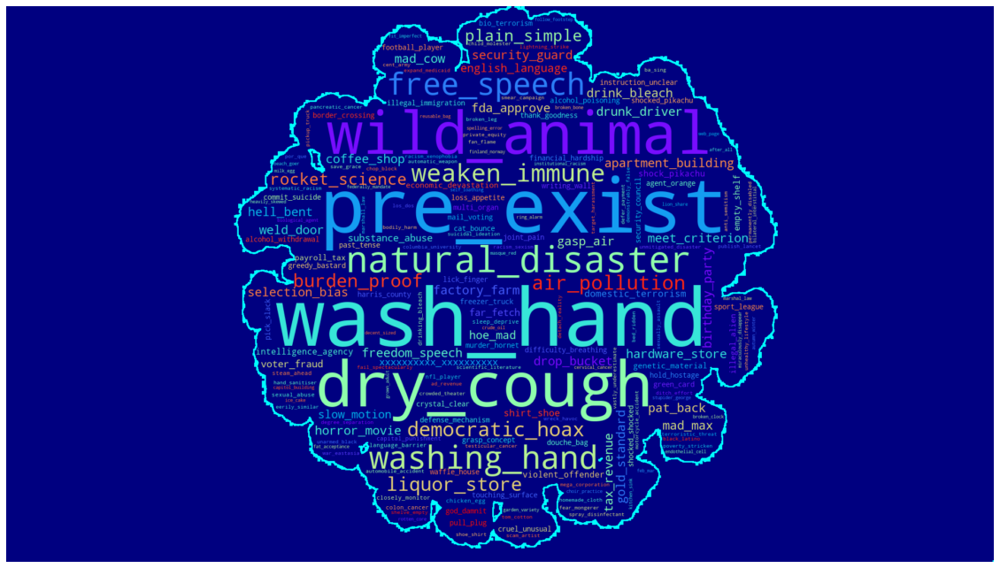

In [ ]:
wordcloud2 = WordCloud(width = 3000, height = 2000, min_word_length=3, background_color='navy', contour_color='cyan', contour_width=4, mask=mask_covid, colormap='rainbow')
wordcloud2.generate_from_frequencies(text_negative)
plot_cloud(wordcloud2)

In [ ]:
# wordcloud.to_file('wordcloud_com_positive_WFLO.png')
# wordcloud2.to_file('wordcloud_com_negative_WFLO.png')

# Analysis of Upvoted and Downvoted Comments
-----

In [ ]:
df_sentiment = pd.read_pickle('pickle/comments_sentiment.pkl')

In [ ]:
df_tokens = pd.read_pickle('pickle/comments_tokenized.pkl')

## Observe statistics of upvoted and downvoted comments

In [ ]:
df_upvoted = df_sentiment[df_sentiment['score']>1]
df_downvoted = df_sentiment[df_sentiment['score']<1]

print(df_upvoted.shape)
print(df_downvoted.shape)

(2277665, 11)
(527441, 11)


In [ ]:
df_upvoted.score.describe()

count    2.277665e+06
mean     8.233807e+00
std      5.675927e+01
min      2.000000e+00
25%      2.000000e+00
50%      3.000000e+00
75%      6.000000e+00
max      1.124700e+04
Name: score, dtype: float64

In [ ]:
df_downvoted.score.describe()

count    527441.000000
mean         -2.002017
std           5.319078
min        -642.000000
25%          -2.000000
50%           0.000000
75%           0.000000
max           0.000000
Name: score, dtype: float64

## Extract highly upvoted comments (75th percentile)
-----

In [ ]:
# comments in the 75th percentile of upvotes
df_upvoted_75q = df_upvoted[df_upvoted['score']>=6]

### Tokenization

In [ ]:
upvoted_index = df_upvoted_75q.index
print(upvoted_index)

Int64Index([   9723,    9734,    9782,    9794,    9899,    9917,   10024,
              10031,   10198,   10293,
            ...
            9413283, 9413287, 9413291, 9413299, 9413301, 9413306, 9413311,
            9413315, 9413321, 9413322],
           dtype='int64', length=650753)


In [ ]:
df_upvoted_tokenized = df_tokens[df_tokens.index.isin(upvoted_index)]

In [ ]:
df_upvoted_tokenized.head()

,body,month
9723,"[go, lie, eat, animal, alive, deserve, die]",2020-01
9734,"[vaccines, population, reduction, plot, specifically, skepticism, plot, kill, idiot, world, lord, common, sense, scientific, knowledge, seriously, get, life, vaccinate, care, learn, real, science]",2020-01
9782,"[people, die, cure, case, internationally, would, big, deal, edit, sorry, shouldn, quick, aggressive, think, speed, virus, spread, pair, fact, symptom, show, week, alarming, fatal, case]",2020-01
9794,"[think, mainly, fast, spread, pair, story, wuhan, cover, thing, there, fact, spread, day, symptom, figure, fast, figure, contagion]",2020-01
9899,"[prepared, hurt]",2020-01


### Build corpus with bigrams included

In [ ]:
upvoted_docs_list = df_upvoted_tokenized['body'].to_list()

In [ ]:
bigram = Phrases(upvoted_docs_list, min_count=20, threshold=100, connector_words=ENGLISH_CONNECTOR_WORDS)
bigram_phraser = gensim.models.phrases.Phraser(bigram)
docs_with_bigrams = [bigram_phraser[doc] for doc in upvoted_docs_list]

In [ ]:
import itertools
docs_with_bigrams_merged = list(itertools.chain.from_iterable(docs_with_bigrams))

In [ ]:
print(docs_with_bigrams_merged[:10])
len(docs_with_bigrams_merged)

['go', 'lie', 'eat', 'animal', 'alive', 'deserve', 'die', 'vaccines', 'population', 'reduction']


9577998

In [ ]:
# build corpus with upvoted comments for now
corpus = [' '.join(docs_with_bigrams_merged)]

## Extract highly downvoted comments (75th percentile)
-----

In [ ]:
df_downvoted_25q = df_downvoted[df_downvoted['score']<=-2]

### Tokenization

In [ ]:
downvoted_index = df_downvoted_25q.index
print(downvoted_index)

Int64Index([   9508,    9721,    9786,    9857,    9867,    9916,    9963,
              10057,   10122,   10444,
            ...
            9413104, 9413129, 9413172, 9413173, 9413211, 9413215, 9413255,
            9413274, 9413289, 9413327],
           dtype='int64', length=151199)


In [ ]:
df_downvoted_tokenized = df_tokens[df_tokens.index.isin(downvoted_index)]

In [ ]:
print(df_downvoted_tokenized.shape)
df_downvoted_tokenized.head()

(151199, 2)


,body,month
9508,"[eat, chicken, foot]",2020-01
9721,"[sure, inject, shit, probably, kill, year, hide, crap, put, inside, vaccine, activate, cancer, year, so, injection, entire, thing, population, reduction, plot]",2020-01
9786,"[learn, elite, world, order, believe, population, reduction, eco, fascism, more, popular, ever, could, say, ve, finally, decide, cull, population, world, elitist, kind, mentality, believe, many, people, so, stupid, believe, vaccine, logical, reaction, global, super, virus, already, infect, hundred, thousand, climate, fanatic, exactly, same, can, come, term, reality, research, aren, go, find, half, stuff, look, current, state, censor, google, searches]",2020-01
9857,"[random, virus, pop, hundred, year, coronavirus, just, get, medium, attention, normal, random, virus, only, people, seriously, affect, elderly, chronic, health, condition, flu, preventable, disease, death, toll, dwarf, coronavirus, comparison]",2020-01
9867,"[one, affect, virus, percentage, die, percentage, people, consume, vaccine, panic, fear, die, take, vaccine, thought, suppose, help, call, double, whammy, scientific, research, study, show, live, virus, vaccine, remain, dormant, year, show, symptom, way, cull, population, bread, crumb, just, die, later, life, natural, cause, hope, open, mind, enlightenment, start, question, world, instead, take, face, value, big, search, engine, work, plot, diffuse, awaken, hide, information, damage, elite, world, order, open, plan, population, control, reduction, agenda, good, place, start, look, eco, fascist, trend, see, lately, quick, way, revert, human, impact, earth, rid, elitist, believe, human, parasite, earth, re, gate, keeper, future, civilization, want, ...]",2020-01


### Build corpus with bigrams included

In [ ]:
downvoted_docs_list = df_downvoted_tokenized['body'].to_list()

In [ ]:
bigram = Phrases(downvoted_docs_list, min_count=20, threshold=100, connector_words=ENGLISH_CONNECTOR_WORDS)
bigram_phraser = gensim.models.phrases.Phraser(bigram)
docs_with_bigrams = [bigram_phraser[doc] for doc in downvoted_docs_list]

2021-03-09 22:35:53,633 : INFO : collecting all words and their counts
2021-03-09 22:35:53,634 : INFO : PROGRESS: at sentence #0, processed 0 words and 0 word types
2021-03-09 22:35:53,897 : INFO : PROGRESS: at sentence #10000, processed 119460 words and 96811 word types
2021-03-09 22:35:54,110 : INFO : PROGRESS: at sentence #20000, processed 241391 words and 176625 word types
2021-03-09 22:35:54,327 : INFO : PROGRESS: at sentence #30000, processed 367085 words and 251165 word types
2021-03-09 22:35:54,546 : INFO : PROGRESS: at sentence #40000, processed 499302 words and 325395 word types
2021-03-09 22:35:54,784 : INFO : PROGRESS: at sentence #50000, processed 634914 words and 395119 word types
2021-03-09 22:35:55,014 : INFO : PROGRESS: at sentence #60000, processed 774056 words and 462894 word types
2021-03-09 22:35:55,285 : INFO : PROGRESS: at sentence #70000, processed 917123 words and 528377 word types
2021-03-09 22:35:56,169 : INFO : PROGRESS: at sentence #80000, processed 1056552

In [ ]:
docs_with_bigrams_merged = list(itertools.chain.from_iterable(docs_with_bigrams))

In [ ]:
downvoted_corpus = [' '.join(docs_with_bigrams_merged)]

In [ ]:
# append downvoted corpus to corpus
corpus.append(downvoted_corpus[0])

In [ ]:
print(len(corpus))

'''
corpus[0] - 'upvoted' corpus
corpus[1] - 'downvoted' corpus
'''


2


## Generate word clouds
-----

#### Vectorize corpus to bag-of-words representation

In [ ]:
c_vectorizer = CountVectorizer()
X = c_vectorizer.fit_transform(corpus)

In [ ]:
X.shape

(2, 110405)

In [ ]:
X = X.toarray()

In [ ]:
bow = pd.DataFrame(X, columns = c_vectorizer.get_feature_names())
bow.index = ['upvoted','downvoted']

In [ ]:
bow

,aa,aaa,aaaa,aaaaaa,aaaaaaaaa,aaaaaaaaaa,aaaaaaaaaaaaah,aaaaaaaaaaaaall,aaaaaaaaaaaand,aaaaaaaaaand,...,zyrtec,zyzz,zzz,zzzquil,zzzt,zzzz,zzzzz,zzzzzzzzzz,zzzzzzzzzzzz,zzzzzzzzzzzzz
upvoted,21,10,2,0,1,0,0,1,1,3,...,4,1,1,1,0,0,1,2,1,0
downvoted,3,2,2,1,1,1,1,0,0,1,...,0,0,2,0,1,3,0,1,1,1


### Generate word clouds using word frequency (not used)

In [ ]:
text = bow.loc['upvoted'].sort_values(ascending=False).to_dict()
wordcloud = WordCloud(min_word_length=3, background_color='maroon', colormap='Pastel2')
wordcloud.generate_from_frequencies(text)
plot_cloud(wordcloud)

In [ ]:
text = bow.loc['downvoted'].sort_values(ascending=False).to_dict()
wordcloud = WordCloud(min_word_length=3, background_color='maroon', colormap='Pastel2')
wordcloud.generate_from_frequencies(text)
plot_cloud(wordcloud)

### Generate word clouds using log odds ratio

In [ ]:
t_bow_df = pd.DataFrame()

# By candidate, divide the number of times a word is said, 
# by the total number of times they've said all the words that they have said (frequency)
bow_transformed = bow.apply(lambda x: (x+1)/(bow.loc[x.name].sum()+1), axis=1)

In [ ]:
for vote in tqdm(t_bow_df.index):
    feat_s = bow[bow.index != vote].sum() + 1
    feat_s_all = np.sum(bow[bow.index != vote].sum())
    tot = feat_s / feat_s_all
    row = bow_transformed.loc[vote] / tot
    row = pd.DataFrame(row).T
    results = row.apply(lambda x: math.log(x,2))

    t_bow_df = pd.concat([t_bow_df, pd.DataFrame([results], index=[vote])])

100%|██████████| 2/2 [00:11<00:00,  5.51s/it]


In [ ]:
# # Save dataframe
# t_bow_df.to_pickle('pickle/comments_updownvote_tbow.pkl')
# t_bow_df = pd.read_pickle('comments_updownvote_tbow.pkl')

In [ ]:
t_bow_df.sort_values(by='upvoted', axis=1)

,long_term,fake_news,nursing_home,social_distance,mental_health,flu_season,healthcare_worker,survival_rate,yesterday_today,family_member,...,wall_street,diamond_princess,sore_throat,hazard_pay,parent_grandparent,blood_clot,shake_hand,false_negative,spring_break,intensive_care
upvoted,-11.993753,-11.417769,-11.276844,-11.001917,-10.559483,-10.519093,-10.365572,-9.911194,-9.861806,-9.847379,...,5.913367,5.993817,6.027650,6.03242,6.079264,6.115675,6.403955,6.590146,6.822669,6.868730
downvoted,11.993752,11.417768,11.276843,11.001916,10.559482,10.519093,10.365572,9.911193,9.861805,9.847378,...,-5.913368,-5.993818,-6.027651,-6.03242,-6.079265,-6.115676,-6.403956,-6.590146,-6.822669,-6.868731


In [ ]:
upvoted = t_bow_df.loc['upvoted'].sort_values(ascending=False).to_dict()
downvoted = t_bow_df.loc['downvoted'].sort_values(ascending=False).to_dict()

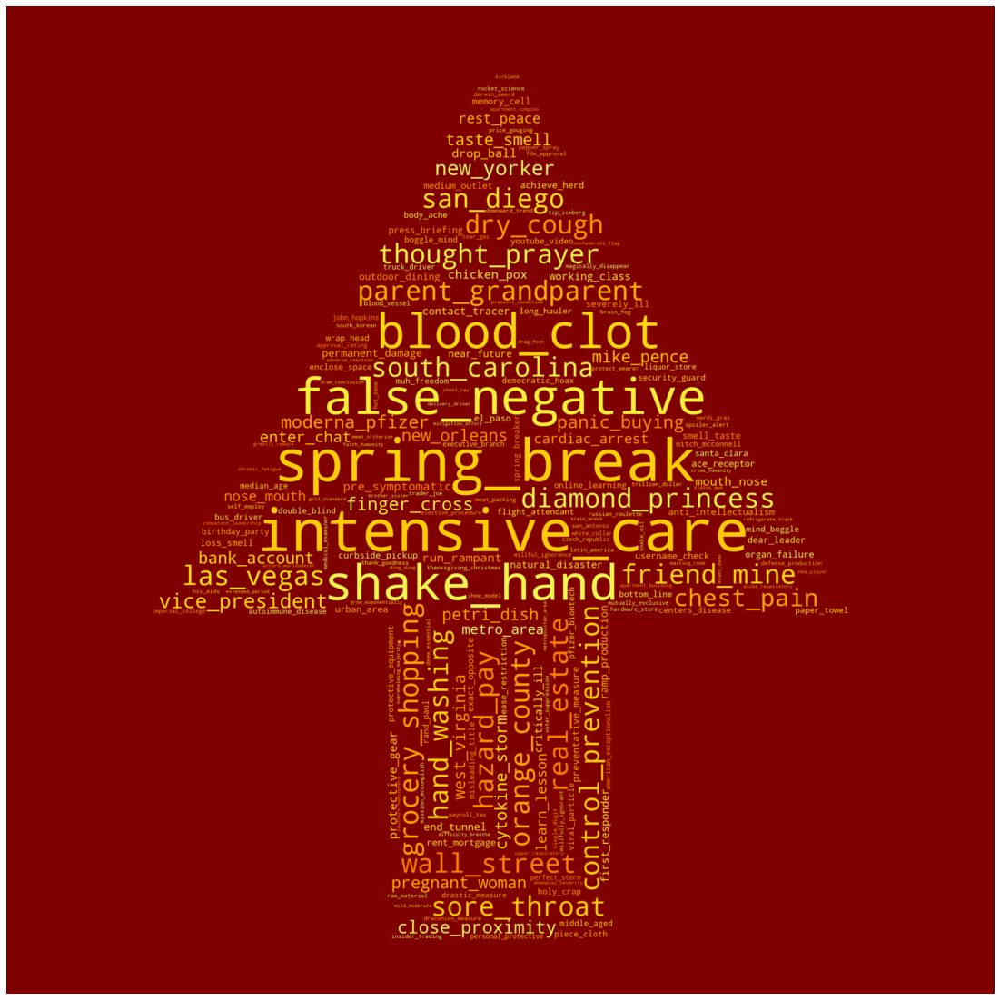

In [ ]:
wordcloud = WordCloud(mask=mask_upvote, min_word_length=3, background_color='maroon', colormap='Wistia')
wordcloud.generate_from_frequencies(upvoted)
plot_cloud(wordcloud)

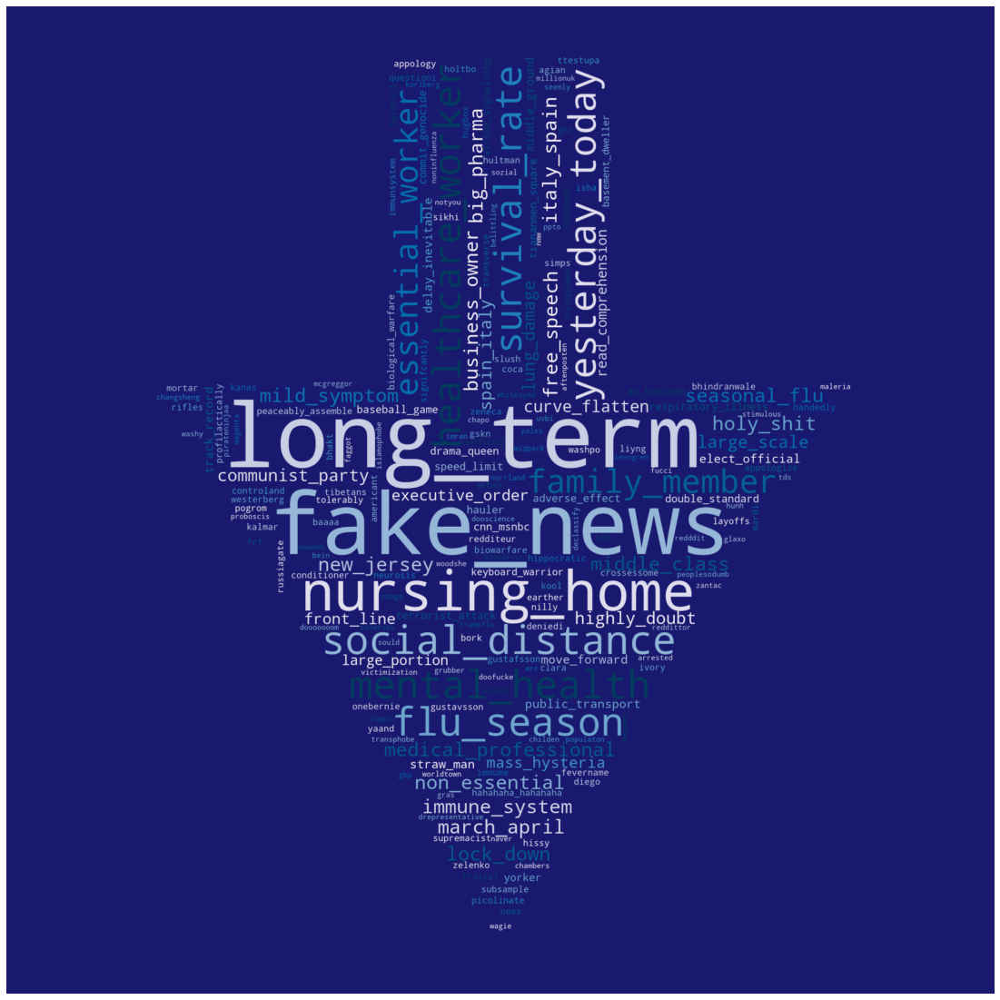

In [ ]:
wordcloud = WordCloud(mask=mask_downvote, min_word_length=3, background_color='midnightblue', colormap='GnBu')
wordcloud.generate_from_frequencies(downvoted)
plot_cloud(wordcloud)

# Topic Modelling
-----

In [ ]:
df = pd.read_pickle('pickle/comments_tokenized.pkl')

In [ ]:
df.shape

(8499244, 2)

In [ ]:
df

,body,month
0,[],2020-01
1,"[commerce, happen, aliexpress, product, come, china, contaminate]",2020-01
2,"[depend, many, factor, contaminate, good, handle, product, answer, likelihood, low, especially, good, perishable, product]",2020-01
3,"[ahhh, sweet, sweet, purge, play, plague, fun, get, virus, evolve, ahead, infect, destroy, world, coronavirus, respiratory, hard, go, global, boot, app, design]",2020-01
4,"[china, flu]",2020-01
...,...,...
9413326,"[feel, need, convince, people, there, tangible, benefit, get, vaccine, immediately, need, revise, message, asap, away, even, vaccine, need, socially, distance, wear, mask, foreseeable, future, should, still, take, precaution, public, high, risk, population, once, vaccinate, can, start, resume, normal, activity, even, hard, time, convincing, year, old, mil, sign, vaccine, big, objection, longterm, effect, aren, aware, say, can, start, have, bible, study, even, vaccinate, point, even, get]",2021-01
9413327,"[simple, stop, report, india, country, million, starve, food, get, export]",2021-01
9413328,"[think, would, pay, man, quick, outpatient, procedure, instead, woman, have, actual, surgery]",2021-01
9413329,"[end, day, row, vaccine, go, change, be, month, us, isn, big, deal, grand, scheme, thing, poor, country, haven, start, will, wait, dose, suck]",2021-01


## Filter comments

Some comments have little to no tokens after the preprocessing/tokenization step done in the early stage. Filter out these comments.

In [ ]:
# Remove comments with less than 7 terms
processed_lengths = list(map(lambda x: len(x),df['body']))
short_comments = np.where(np.array(processed_lengths)<7)[0]

In [ ]:
df.index = np.arange(0,len(df))

In [ ]:
df.drop(list(short_comments), inplace=True)

In [ ]:
df.shape

(5243419, 2)

In [ ]:
# # Save dataframe of filtered data
# df.to_pickle('pickle/comments_tokenized_filtered.pkl')

## Build dictionary and bag-of-words corpus

In [ ]:
df = pd.read_pickle('pickle/comments_tokenized_filtered.pkl')

In [ ]:
processed_docs_list = df['body'].to_list()

In [ ]:
len(processed_docs_list)

5243419

In [ ]:
# Generate bigrams
bigram = Phrases(processed_docs_list, min_count=20, threshold=100, connector_words=ENGLISH_CONNECTOR_WORDS)
bigram_phraser = gensim.models.phrases.Phraser(bigram)
docs_with_bigrams = [bigram_phraser[doc] for doc in processed_docs_list]

In [ ]:
dictionary = corpora.Dictionary(docs_with_bigrams)

In [ ]:
print(dictionary)

Dictionary(438614 unique tokens: ['aliexpress', 'china', 'come', 'commerce', 'contaminate']...)


In [ ]:
# Filter dictionary
dictionary.filter_extremes(no_below=10, no_above=0.8, keep_n=100000)

2021-03-07 17:36:34,918 : INFO : discarding 376597 tokens: [('irn', 5), ('backon', 4), ('wuhanpneumonia', 2), ('quarentina', 1), ('redditrequ', 2), ('cryofrozen', 1), ('gurrny', 1), ('riskthis', 4), ('thismorbidity', 1), ('stretchere', 1)]...
2021-03-07 17:36:34,919 : INFO : keeping 62017 tokens which were in no less than 10 and no more than 4194735 (=80.0%) documents
2021-03-07 17:36:35,155 : INFO : resulting dictionary: Dictionary(62017 unique tokens: ['aliexpress', 'china', 'come', 'commerce', 'contaminate']...)


In [ ]:
# Transform all processed documents into bag-of-words representation based on dictionary
bow_corpus = [dictionary.doc2bow(doc) for doc in docs_with_bigrams]

In [ ]:
# should be 5243419 (number of comments)
len(bow_corpus)

5243419

## Generate multiple LDA models and find optimal number of topics

In [ ]:
def compute_coherence_values(dictionary, corpus, documents, start, limit, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dict : Gensim dictionary
    corp : Gensim corpus
    text : List of input texts

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    model_list = []
    coherence_values = []
    for num_topics in range(start, limit, step):
        lda_model = gensim.models.LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics, workers=3)
        model_list.append(lda_model)
        coherencemodel = CoherenceModel(model=lda_model, texts=documents, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary = dictionary, corpus = bow_corpus, documents = docs_with_bigrams, start = 4, limit = 25, step = 4)

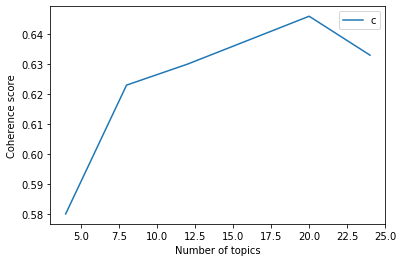

The model with num_topics = 4 has a coherence value of 0.580
The model with num_topics = 8 has a coherence value of 0.623
The model with num_topics = 12 has a coherence value of 0.630
The model with num_topics = 16 has a coherence value of 0.638
The model with num_topics = 20 has a coherence value of 0.646
The model with num_topics = 24 has a coherence value of 0.633


In [ ]:
# Show graph
limit=25; start=4; step=4
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

for model, value in zip(x, coherence_values):
    print(f'The model with num_topics = {model} has a coherence value of {value:.3f}')

In [ ]:
# # Generate graph with plotly

# coherence_values = [0.580, 0.623, 0.630, 0.638, 0.646, 0.633]
# x = [4,8,12,16,20,24]
# fig = go.Figure(data=go.Scatter(x=x, y=coherence_values))

# fig.update_layout(
#     xaxis = dict(
#         tickmode = 'linear',
#         tick0 = 4,
#         dtick = 4,
#         title = 'Number of topics'
#     ),
#     yaxis_title='Coherence value',
#     width = 600
# )

# fig.show()

## Build optimal model (20 topics)

In [ ]:
comments_ldamodel = gensim.models.LdaMulticore(corpus=bow_corpus, id2word=dictionary, num_topics=20, workers=3)

In [ ]:
'''
Save dictionary and LDA model
'''
# comments_ldamodel.save('comments_ldamodel_full')

'''
Load LDA model and dictionary
'''
# comments_ldamodel = models.LdaMulticore.load('models/comments_ldamodel_full')
# dictionary = gensim.corpora.Dictionary.load('models/comments_ldamodel_full.id2word')

In [ ]:
data = [[topic, words] for topic, words in comments_ldamodel.print_topics()]

df_topics = pd.DataFrame(
    data, columns = ['Topic', 'Words']
)

display(df_topics)

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(comments_ldamodel, bow_corpus, dictionary)
pyLDAvis.display(vis)
# pyLDAvis.save_html(vis, 'visualisations/comments_ldamodel_20topics.html')

## Analyse LDA model

### Finding the dominant topic in each document
-----

In [ ]:
def maintopic_in_doc (ldamodel, corpus, text):
    df_docswithtopic = pd.DataFrame()

    for corpus, topics in enumerate(ldamodel[corpus]):
        topics = sorted(topics, key=lambda x: (x[1]), reverse=True)
        # row[0] has highest topic weight
        for index, (topic_num, weight) in enumerate(topics):
            if index == 0:
                df_docswithtopic = df_docswithtopic.append(pd.Series([topic_num, round(weight, 3)]), ignore_index=True)
            else:
                break
    df_docswithtopic.columns = ['dominant_topic', 'weight']

    df_docswithtopic = pd.concat([df_docswithtopic, text], axis=1)
    return(df_docswithtopic)

In [ ]:
df_original = pd.read_pickle('pickle/comments_processed.pkl')
display(df_original.head())

In [ ]:
df_LDA = pd.read_pickle('pickle/comments_tokenized_filtered.pkl')

In [ ]:
indexes = df_LDA.index

In [ ]:
df_LDA_untokenizedcomments = df_original.iloc[indexes]

In [ ]:
df_LDA_untokenizedcomments = df_LDA_untokenizedcomments.loc[:, ['body','month','score']].reset_index(drop=True)

In [ ]:
df_LDA_untokenizedcomments.head()

In [ ]:
df_maintopicindoc = maintopic_in_doc(comments_ldamodel, bow_corpus, df_LDA_untokenizedcomments)

In [ ]:
df_maintopicindoc['dominant_topic'] = df_maintopicindoc['dominant_topic'].astype('int32')

In [ ]:
# df_maintopicindoc.to_pickle('pickle/comments_topic-weight-score.pkl')
# df_maintopicindoc = pd.read_pickle('pickle/comments_topic-weight-score.pkl')

In [ ]:
df_maintopicindoc

,dominant_topic,weight,body,month,score
0,4,0.327,what about all the e commerce happening on AliExpress? Can products coming from China be contaminated?,2020-01,1
1,2,0.288,That depends on many factors If someone who is contaminated the goods handled the products then the answer would be yes Otherwise the likelihood is low especially if the goods are not perishable products,2020-01,1
2,9,0.262,Ahhh sweet sweet purge !! Ever played plague inc It's fun! You get to be a virus and evolve ahead of the WHO and infect and destroy the world! Coronavirus is respiratory Hard to go global with it Could be done Hmm I'll boot up the app and design and get back to ya,2020-01,1
3,14,0.301,The news said it came from a raw fish market In order to keep people safe I think they should ban flights leaving China to international Nations,2020-01,1
4,6,0.690,The CDC is announcing the first US outbreak this afternoon Good luck Washington State,2020-01,1
...,...,...,...,...,...
5243414,10,0.234,I feel like we need to convince people that there is a tangible benefit to getting the vaccine immediately We need to revise the messaging ASAP away from even if you ve had the vaccine you still need to socially distance and wear masks for the foreseeable future and towards you should still take precautions in public and around high risk populations but once vaccinated you can start resuming normal activities I ve even had a hard time convincing my year old MIL to sign up for the vaccine Her biggest objections are What if it has longterm effects we aren t aware of? And They say we can t start having our bible study again even if we re all vaccinated so what s the point in even getting it?,2021-01,2
5243415,0,0.462,It's simple stop reporting India is a country where millions starve even as food gets exported,2021-01,-15
5243416,1,0.198,Yup you'd think they would rather pay for a man to have a quick outpatient procedure instead of a woman having an actual surgery,2021-01,2
5243417,17,0.438,Yes at the end of the day this row over the vaccines between the EU and AZ is not going to change much We'll be months behind the UK US which isn't that big a deal in the grand scheme of things Many poor countries haven't started yet and many will have to wait until to get their first doses which sucks for them,2021-01,2


### Find the top document of each topic
-----

In [ ]:
df_representativedoc = pd.DataFrame()

df_groupedtopics = df_maintopicindoc.groupby('dominant_topic')

for i, group in df_groupedtopics:
    df_representativedoc = pd.concat([df_representativedoc, group.sort_values(['weight'], ascending=False).head(1)], axis=0)

In [ ]:
df_representativedoc.head()

,dominant_topic,weight,body,month,score
1633472,0,0.947,Food prices are way up too All sales are gone now Basically food went up of more just due to no sales Food is priced for a sale no sale market price,2020-03,1
4522442,1,0.996,Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote Vote,2020-10,18
4817984,2,0.980,Corona has a strong seasonal effect Wrong Corona has a weak seasonal effect but it is different from the flu True Because the flu has a strong seasonal effect The flu almost completely dies out in the summerTrue Because it has a strong seasonal effect Corona does not and still spreads at a reduced rate True But the rate is not reduced by much Both corona and flu spread much more easily in winter Wrong Only the flu spreads much more easily in winter Corona only spreads slightly more in winter,2020-11,1
4548575,3,0.990,Wash hands cover face wash hands cover face fash hands cover face wash hands cover face Wash hands cover face wash hands cover face fash hands cover face wash hands cover face Wash hands cover face wash hands cover face fash hands cover face wash hands cover face Wash hands cover face wash hands cover face fash hands cover face wash hands cover face Wash hands cover face wash hands cover face fash hands cover face wash hands cover face Wash hands cover face wash hands cover face fash hands cover face wash hands cover face,2020-10,1
2416333,4,0.970,Dragged down by the stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone stone,2020-04,1


In [ ]:
# df_maintopicindoc[df_maintopicindoc['dominant_topic']==6].sort_values(by='weight', ascending=False).head(20)

### Topic distribution of comments
-----

In [ ]:
# Number of documents for each topic
topic_counts = df_maintopicindoc['dominant_topic'].value_counts().sort_index()
# Percentage of documents for each topic
topic_contribution = round(topic_counts/topic_counts.sum(), 3)
df_topicdistribution = pd.concat([topic_counts, topic_contribution], axis=1)
df_topicdistribution.index.names = ['topic']
df_topicdistribution.columns = ['number_of_submissions', 'percentage']

2021-04-13 18:14:29,052 : INFO : NumExpr defaulting to 4 threads.


In [ ]:
# Label themes
themes = ['Food & supplies', 'Angry & hateful comments', 'Comparison of COVID-19 with other strains/viruses', 'Personal preventive measures', 'Handling of COVID-19 by US & China', 'Negative outlook towards the situation', 'Government response', 'Scientific studies & sources', 'Infection rate & death toll', 'Miscellaneous topics', 'Putting lives at risk', 'Staying at home', 'Virus transmission from animals', 'Accuracy of tests', 'Lockdown & travel restrictions', 'Shortage of medical resources', 'Long-term effects', 'Measure of time', 'Economy, jobs & income', 'Effectiveness & availability of vaccines']

In [ ]:
df_topicdistribution['theme'] = themes
df_topicdistribution

,number_of_submissions,percentage,theme
topic,,,
0,126324,0.024,Food & supplies
1,477786,0.091,Angry & hateful comments
2,352425,0.067,Comparison of COVID-19 with other strains/viruses
3,223512,0.043,Personal preventive measures
4,222772,0.042,Handling of COVID-19 by US & China
5,841116,0.160,Negative outlook towards the situation
6,95045,0.018,Government response
7,396176,0.076,Scientific studies & sources
8,321374,0.061,Infection rate & death toll


In [ ]:
fig = px.pie(df_topicdistribution, values='percentage', names='theme', title='Proportion of comment topics', hole=0.5, height=600, width=1000, color_discrete_sequence=px.colors.qualitative.D3)

fig.show()

### Topic distribution of comments across time
-----

In [ ]:
df_weightmonth = df_maintopicindoc.groupby(['month','dominant_topic']).size().reset_index(name='size')

In [ ]:
df_weightmonth['theme'] = themes * 13

In [ ]:
df_weightmonth

,month,dominant_topic,size,theme
0,2020-01,0,703,Food & supplies
1,2020-01,1,1797,Angry & hateful comments
2,2020-01,2,3231,Comparison of COVID-19 with other strains/viruses
3,2020-01,3,1543,Personal preventive measures
4,2020-01,4,1467,Handling of COVID-19 by US & China
...,...,...,...,...
255,2021-01,15,1855,Shortage of medical resources
256,2021-01,16,4403,Long-term effects
257,2021-01,17,12374,Measure of time
258,2021-01,18,6485,"Economy, jobs & income"


In [ ]:
df_weightmonth[df_weightmonth['dominant_topic']==0]['weight_month']

0      0.02695
20     0.03484
40     0.03098
60     0.02994
80     0.02212
100    0.01603
120    0.01499
140    0.01446
160    0.01356
180    0.01272
200    0.01670
220    0.01485
240    0.01726
Name: weight_month, dtype: float64

In [ ]:
df_weightmonth.groupby('month')['size'].sum()

month
2020-01      26084
2020-02     259641
2020-03    1491030
2020-04     970350
2020-05     526516
2020-06     313765
2020-07     456429
2020-08     271113
2020-09     163521
2020-10     197448
2020-11     201815
2020-12     215333
2021-01     150374
Name: size, dtype: int64

In [ ]:
def f(df, month, size):
    commentsinmonth = df[df['month'] == month]['size'].sum()
    weight = round(size/commentsinmonth, 5)
    return weight

In [ ]:
df_weightmonth['weight_month'] = df_weightmonth.apply(lambda x: f(df_weightmonth, x['month'], x['size']), axis=1)

In [ ]:
df_weightmonth

,month,dominant_topic,size,theme,weight_month
0,2020-01,0,703,Food & supplies,0.02695
1,2020-01,1,1797,Angry & hateful comments,0.06889
2,2020-01,2,3231,Comparison of COVID-19 with other strains/viruses,0.12387
3,2020-01,3,1543,Personal preventive measures,0.05916
4,2020-01,4,1467,Handling of COVID-19 by US & China,0.05624
...,...,...,...,...,...
255,2021-01,15,1855,Shortage of medical resources,0.01234
256,2021-01,16,4403,Long-term effects,0.02928
257,2021-01,17,12374,Measure of time,0.08229
258,2021-01,18,6485,"Economy, jobs & income",0.04313


In [ ]:
topics = df_weightmonth['dominant_topic'].unique()
months = df_weightmonth['month'].unique()

fig = go.Figure()

for topic in topics:
    fig.add_trace(go.Scatter(x=months, y=df_weightmonth[df_weightmonth['dominant_topic']==topic]['weight_month'], mode='lines', name=str(topic)))

fig.show()

In [ ]:
# df_weightmonth[df_weightmonth['dominant_topic']==0].theme.unique()[0]

'Food & supplies'

In [ ]:
from plotly.subplots import make_subplots

topics = df_weightmonth['dominant_topic'].unique()
months = df_weightmonth['month'].unique()

rows = 10
columns = 2

fig = make_subplots(rows=rows, cols=columns, shared_yaxes=True)

for topic in topics:
    fig.add_trace(go.Scatter(x=months, y=df_weightmonth[df_weightmonth['dominant_topic']==topic]['weight_month'], mode='lines', name=df_weightmonth[df_weightmonth['dominant_topic']==topic].theme.unique()[0]), row=(topic//columns)+1, col=(topic%columns)+1)


fig.update_layout(
    height=1200,
    width=1000,
    title_text="Topic distribution of comments",
    colorway=px.colors.qualitative.D3
    )

fig.update_yaxes(title_text="Percentage", range=[0, 0.17])
fig.show()